In [1]:
# EP2_Augmentation
### EP2 MAC0417 / MAC5768
##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,#
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO #
# DESTE EP. #
# TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM #
# DESONESTIDADE ACADÊMICA OU PLÁGIO. #
# #
# DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS #
# DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E #
# DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP. #
# #
# ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR #
# DESONESTIDADE ACADÊMICA. #
# #
# #
# Nome : Jose Vitor Pereira Garzon
# NUSP : 9267071
# Turma: MAC0417-145-2024
# Prof.: Ronaldo Fumio Hashimoto
# Monitor: Marcos Freitas Parra
##################################################################

### Inicando pelo arquivo sample.json

### Criando Metadados_Original com o caminho para as imagens, através de um arquivo.json(sample) baixado

In [1]:
import os
import json
import matplotlib.pyplot as plt
# INICIALMENTE as imagens coloridas devem estar na mesma pasta onde se está rodando o Jupyter Notebook

# Caminho para o arquivo JSON contendo os dados das imagens
diretorio_atual = os.getcwd()
caminho_arquivo_json = r'C:\Users\josef\Desktop\EP2\sample.json' #colocar a pasta onde o sample.json se encontra

# Carregar dados do arquivo JSON
with open(caminho_arquivo_json, 'r') as arquivo:
    Metadados = json.load(arquivo)

# Lista para armazenar metadados de todas as imagens
Metadados_Original = []

# Percorre os metadados e converte cada imagem para escala de cinza
for nome_imagem, dados_imagem in Metadados.items():
    categoria = f"{dados_imagem['Fundo']}_{dados_imagem['Luminosidade']}"
    
    try:
        caminho_completo_imagem = os.path.join(diretorio_atual , nome_imagem) #O caminho completo é a pasta onde estão as iamgens + o nome das imagens.jpg
        imagem_original = plt.imread(caminho_completo_imagem)
        
        # Criar um dicionário com os metadados da imagem atual
        metadados_imagens = {
            'Fundo': dados_imagem['Fundo'],
            'Luminosidade': dados_imagem['Luminosidade'],
            'Classes': dados_imagem['Classes'],
            'Caminho': caminho_completo_imagem  # Caminho absoluto para a imagem
        }
        
        # Adicionar metadados da imagem à lista
        Metadados_Original.append({nome_imagem: metadados_imagens})
        
        print(f"Metadados da imagem '{nome_imagem}' processados com sucesso.")
    except Exception as e:
        print(f"Erro ao processar imagem '{nome_imagem}': {e}")
    
# Salvar metadados de todas as imagens em um arquivo JSON
saida_json = os.path.join(diretorio_atual, "Metadados_Original_Salvo.json")
with open(saida_json, "w") as outfile:
    json.dump(Metadados_Original, outfile, indent=2)

print("\nProcessamento concluído. Metadados salvos em 'Metadados_Original_Salvo.json'.")


Metadados da imagem 'Fundo Branco - Ilumi Dia_Claro - Classe A  (1).jpg' processados com sucesso.
Metadados da imagem 'Fundo Branco - Ilumi Dia_Claro - Classe A  (2).jpg' processados com sucesso.
Metadados da imagem 'Fundo Branco - Ilumi Dia_Escuro - Classe A  (3).jpg' processados com sucesso.
Metadados da imagem 'Fundo Branco - Ilumi Dia_Escuro - Classe A  (4).jpg' processados com sucesso.
Metadados da imagem 'Fundo Branco - Ilumi Noite_Claro - Classe A  (5).jpg' processados com sucesso.
Metadados da imagem 'Fundo Branco - Ilumi Noite_Claro - Classe A  (6).jpg' processados com sucesso.
Metadados da imagem 'Fundo Branco - Ilumi Noite_Escuro - Classe A  (7).jpg' processados com sucesso.
Metadados da imagem 'Fundo Branco - Ilumi Noite_Escuro - Classe A  (8).jpg' processados com sucesso.
Metadados da imagem 'Fundo Preto - Ilumi Dia_Claro - Classe A  (1).jpg' processados com sucesso.
Metadados da imagem 'Fundo Preto - Ilumi Dia_Claro - Classe A  (2).jpg' processados com sucesso.
Metadados 

# Apenas Plotanto as Imagens do Metadados_Original

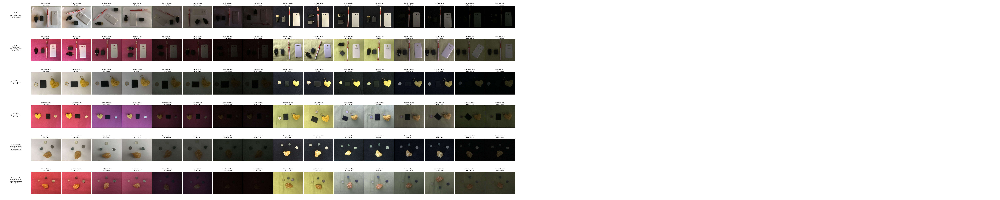

In [7]:
import os
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_images_horizontal(image_data, target_classes1, target_classes2, target_classes3):
    images_to_plot1 = []
    images_to_plot2 = []
    images_to_plot3 = []
    
    # Coletar imagens para target_classes1
    for img_dict in image_data:
        for img_name, img_info in img_dict.items():
            if "Classes" in img_info and any(cls in img_info["Classes"] for cls in target_classes1):
                img_path = img_info["Caminho"]
                images_to_plot1.append((img_path, f'Luminosidades:\n{img_info["Luminosidade"]}'))
    
    # Coletar imagens para target_classes2
    for img_dict in image_data:
        for img_name, img_info in img_dict.items():
            if "Classes" in img_info and any(cls in img_info["Classes"] for cls in target_classes2):
                img_path = img_info["Caminho"]
                images_to_plot2.append((img_path, f'Luminosidades:\n{img_info["Luminosidade"]}'))
    
    # Coletar imagens para target_classes3
    for img_dict in image_data:
        for img_name, img_info in img_dict.items():
            if "Classes" in img_info and any(cls in img_info["Classes"] for cls in target_classes3):
                img_path = img_info["Caminho"]
                images_to_plot3.append((img_path, f'Luminosidades:\n{img_info["Luminosidade"]}'))
    
    # Definir o número máximo de imagens em cada conjunto
    max_images = max(len(images_to_plot1), len(images_to_plot2), len(images_to_plot3))
    
    # Ajustar o número de colunas na figura baseado no máximo de imagens
    num_cols = max_images + 1
    
    # Criar figura com subplots
    fig, axes = plt.subplots(6, num_cols, figsize=(100, 20))  # Ajuste o tamanho da figura conforme necessário
    
    # Plotar imagens e nomes das classes para target_classes1
    plot_images(images_to_plot1[:16], axes[0], target_classes1)
    plot_images(images_to_plot1[16:], axes[1], target_classes1)
    
    # Plotar imagens e nomes das classes para target_classes2
    plot_images(images_to_plot2[:16], axes[2], target_classes2)
    plot_images(images_to_plot2[16:], axes[3], target_classes2)
    
    # Plotar imagens e nomes das classes para target_classes3
    plot_images(images_to_plot3[:16], axes[4], target_classes3)
    plot_images(images_to_plot3[16:], axes[5], target_classes3)
    
    # Remover eixos vazios
    for ax_row in axes:
        for ax in ax_row:
            if ax.get_subplotspec().colspan.start != 0:  # Verifica se a coluna não é a primeira
                ax.axis('off')
    
    plt.tight_layout(pad=0.4)
    plt.show()

def plot_images(images_to_plot, axes_row, target_classes):
    # Plotar os nomes das classes na primeira coluna da linha
    for i, class_name in enumerate(target_classes):
        axes_row[0].text(0.5, 0.5 + i*0.05, class_name, ha='center', va='center', fontsize=9, transform=axes_row[0].transAxes)
        axes_row[0].axis('off')
    
    # Plotar as imagens nas colunas subsequentes
    for i, (img_path, title) in enumerate(images_to_plot):
        # Carregar a imagem com Matplotlib e redimensionar
        img = mpimg.imread(img_path)
        img_resized = img[::4, ::4, :]  # Redimensionar em 1/4
        
        axes_row[i + 1].imshow(img_resized)
        axes_row[i + 1].set_title(title, fontsize=9)
        axes_row[i + 1].axis('off')

# Caminho para o arquivo JSON contendo os dados das imagens
diretorio_atual = os.getcwd()
json_file_path = os.path.join(diretorio_atual, 'Metadados_Original_Salvo.json') # Pasta onde se encontra o Metadados_Original_Salvo

# Carregar dados do arquivo JSON
with open(json_file_path, 'r') as f:
    image_data = json.load(f)

# Lista de classes alvo que quero plotar na mesma linha horizontal
target_classes1 = ['Tampa_Celular', 'Escova_de_Dente', 'Carregador', 'Tomada']
target_classes2 = ['Coracao', 'Quadrado_Preto', 'Moeda_1']
target_classes3 = ['Moeda_Prateada', 'Pedra_Transparente', 'Pedra_Esverdeada', 'Pedra_Amarela']

plot_images_horizontal(image_data, target_classes1, target_classes2, target_classes3)


# OriginalGrayDataset Criado

In [3]:
import os
import json
from PIL import Image
# PIL apenas para fazer operações de leitura pois eu estava tendo problemas com recomendadas

# Função para converter imagem para escala de cinza e salvar na pasta de saída
def converter_para_escala_de_cinza(categoria, nome_arquivo, imagem_original):
    pasta_saida = 'Escala_Cinza'  # Pasta de saída para as imagens processadas

    if not os.path.exists(pasta_saida):
        os.makedirs(pasta_saida)
    
    nome_base = os.path.splitext(os.path.basename(nome_arquivo))[0]
    nome_saida = os.path.join(pasta_saida, f"Cinza_{nome_base}.jpg")
    
    # Converter para escala de cinza
    imagem_cinza = imagem_original.convert('L')
    
    # Redimensionar tamanho da imagem
    img_width, img_height = imagem_cinza.size
    new_size = (img_width // 5, img_height // 5)
    imagem_cinza_redimensionada = imagem_cinza.resize(new_size)
    
    imagem_cinza_redimensionada.save(nome_saida)  # Salva a imagem em escala de cinza na pasta de saída
    
    return nome_saida  # Retorna o nome do arquivo de saída

# Caminho para o arquivo JSON contendo os dados das imagens
diretorio_atual = os.getcwd()
json_file_path = os.path.join(diretorio_atual, 'Metadados_Original_Salvo.json')

# Carregar dados do arquivo JSON
with open(json_file_path, 'r') as f:
    Metadados = json.load(f)

Metadados_Cinza = {}

for img_dict in Metadados:
    for nome_imagem, dados_imagem in img_dict.items():
        categoria = dados_imagem['Fundo'] + '_' + dados_imagem['Luminosidade']
        
    try:
        caminho_completo_imagem = dados_imagem['Caminho']
        imagem_original = Image.open(caminho_completo_imagem)
            
        # Converter imagem para escala de cinza e salvar
        nome_saida = converter_para_escala_de_cinza(categoria, caminho_completo_imagem, imagem_original)
            
        caminho_completo_imagem_cinza = os.path.join(diretorio_atual, nome_saida)
        
        # Adicionar informações ao metadados_cinza
        Metadados_Cinza[nome_saida] = {
            'Fundo': dados_imagem['Fundo'],
            'Luminosidade': dados_imagem['Luminosidade'],
            'Classes': dados_imagem['Classes'],
            'Caminho': caminho_completo_imagem_cinza
        }
        print(f"Imagem '{nome_imagem}' convertida para escala de cinza e salva em '{os.path.dirname(caminho_completo_imagem)}'.")
    except Exception as e:
        print(f"Erro ao processar imagem '{nome_imagem}': {e}")

# Salvar os metadados atualizados em um arquivo JSON
saida_json = os.path.join(diretorio_atual, "Metadados_Cinza_Salvo.json")
with open(saida_json, "w") as outfile:
    json.dump(Metadados_Cinza, outfile, indent=2)

print("\nConversão concluída.")


Imagem 'Fundo Branco - Ilumi Dia_Claro - Classe A  (1).jpg' convertida para escala de cinza e salva em 'C:\Users\josef\Desktop\EP2'.
Imagem 'Fundo Branco - Ilumi Dia_Claro - Classe A  (2).jpg' convertida para escala de cinza e salva em 'C:\Users\josef\Desktop\EP2'.
Imagem 'Fundo Branco - Ilumi Dia_Escuro - Classe A  (3).jpg' convertida para escala de cinza e salva em 'C:\Users\josef\Desktop\EP2'.
Imagem 'Fundo Branco - Ilumi Dia_Escuro - Classe A  (4).jpg' convertida para escala de cinza e salva em 'C:\Users\josef\Desktop\EP2'.
Imagem 'Fundo Branco - Ilumi Noite_Claro - Classe A  (5).jpg' convertida para escala de cinza e salva em 'C:\Users\josef\Desktop\EP2'.
Imagem 'Fundo Branco - Ilumi Noite_Claro - Classe A  (6).jpg' convertida para escala de cinza e salva em 'C:\Users\josef\Desktop\EP2'.
Imagem 'Fundo Branco - Ilumi Noite_Escuro - Classe A  (7).jpg' convertida para escala de cinza e salva em 'C:\Users\josef\Desktop\EP2'.
Imagem 'Fundo Branco - Ilumi Noite_Escuro - Classe A  (8).jp

# Metadados_AugmentedDataSet Com Caminho Para as Imagens.
O Meu deu 11 min. Por causa do laplaciano e da média por convolução

In [6]:
import numpy as np
import os
import json
import matplotlib.pyplot as plt
from PIL import Image
# PIL apenas para fazer operações de leitura pois eu estava tendo problemas com recomendadas

pasta_saida = 'Metadados_AugmentedDataSet'

def AugmentedDataSet(categoria, nome_arquivo, imagem_original):  
    if not os.path.exists(pasta_saida):
        os.makedirs(pasta_saida)
        
    nome_base = os.path.splitext(os.path.basename(nome_arquivo))[0]
    nome_saida1 = os.path.join(pasta_saida, f"Contrast_Stretching_{nome_base}.jpg")  
    nome_saida2 = os.path.join(pasta_saida, f"Laplaciano_{nome_base}.jpg")  
    nome_saida3 = os.path.join(pasta_saida, f"Exponencial_{nome_base}.jpg")
    nome_saida4 = os.path.join(pasta_saida, f"Log_{nome_base}.jpg")
    nome_saida5 = os.path.join(pasta_saida, f"Media_{nome_base}.jpg")
    
    #caminho_completo_imagem = os.path.join(diretorio_imagens, nome_saida1)
    
    # Converter a imagem PIL para um array NumPy
    imagem_original = np.array(imagem_original)
    
    # CONTRAST STRETCHING
    img_contrast_stretching = imagem_original.astype('float32')
    img_contrast_stretching = 255 * (img_contrast_stretching - np.min(img_contrast_stretching)) / (np.max(img_contrast_stretching) - np.min(img_contrast_stretching))
    img_contrast_stretching = np.array(img_contrast_stretching, dtype=np.uint8)
    plt.imsave(nome_saida1, img_contrast_stretching, cmap='gray')
    

    ################################################################################################################################################
    
    # Definir o filtro Laplaciano
    filtro_laplaciano = np.array([
        [1,  1, 1],
        [1, -8, 1],
        [1,  1, 1]
    ])

    # Aplicar o filtro Laplaciano na imagem
    img_filtrada = np.zeros_like(imagem_original)
    for i in range(1, imagem_original.shape[0]-1):
        for j in range(1, imagem_original.shape[1]-1):
            # Aplicar o filtro Laplaciano
            pixel = np.sum(imagem_original[i-1:i+2, j-1:j+2] * filtro_laplaciano)
            # Ajustar o valor do pixel para evitar valores negativos
            img_filtrada[i, j] = np.clip(pixel, 0, 255)

    # Salvar a imagem processada
    plt.imsave(nome_saida2, img_filtrada, cmap='gray')

    ################################################################################################################################################
    # EXPONENCIAL
    img_Exp = imagem_original.astype('float32')
    if categoria in ['Noite_Claro', 'Noite_Escuro']:
        gamma = 0.5
    elif categoria in ['Dia_Escuro']:
        gamma = 0.65
    elif categoria in ['Dia_Claro']:
        gamma = 1 # #Utilizei esse valor para manter a aparência das imagens com Iluminação Dia_Claro que já possuem uma agradável aparência.
    else:
        gamma = 1
    img_Exp = ((img_Exp / 255) ** gamma * 255)
    plt.imsave(nome_saida3, img_Exp, cmap='gray')

    
    # LOGARITMO
    if categoria in ['Noite_Claro', 'Noite_Escuro']:
        img_log = imagem_original.astype('float32')
        c = 255 / (np.log(1 + np.max(img_log))) #Utilizei esse valor para ajustar o contraste e melhorar a visualização de imagens escuras
        img_log = c * np.log(1 + img_log)
    else:
        img_log = imagem_original.astype('float32')
        c = 1.0  #Utilizei esse valor para manter a aparência das imagens mais claras que já possuem uma agradável aparência.
        img_log = c * np.log(1 + img_log)
    
    plt.imsave(nome_saida4, img_log, cmap='gray')
    
################################################################################################################################################
    # FILTRO MEDIA    
    kernel_size = 3
    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size**2)

    img_height, img_width = imagem_original.shape
    filtered_image = np.zeros_like(imagem_original)

    for i in range(img_height - kernel_size + 1):
        for j in range(img_width - kernel_size + 1):
            filtered_image[i + kernel_size // 2, j + kernel_size // 2] = np.sum(
                imagem_original[i:i + kernel_size, j:j + kernel_size] * kernel
            )
    
    plt.imsave(nome_saida5, filtered_image, cmap='gray')
    
    return nome_saida1, nome_saida2, nome_saida3, nome_saida4, nome_saida5

# Caminho para o arquivo JSON contendo os dados das imagens
diretorio_atual = os.getcwd()
json_file_path = os.path.join(diretorio_atual, 'Metadados_Cinza_Salvo.json')

# Carregar dados do arquivo JSON
with open(json_file_path, 'r') as f:
    Metadados = json.load(f)

Metadados_AugmentedDataSet = {}

for nome_imagem, dados_imagem in Metadados.items():
    categoria = f"{dados_imagem['Fundo']}_{dados_imagem['Luminosidade']}"
    
    try:
        caminho_completo_imagem = dados_imagem['Caminho']
        imagem_original = Image.open(caminho_completo_imagem)

        nome_saida1, nome_saida2, nome_saida3, nome_saida4, nome_saida5 = AugmentedDataSet(categoria, caminho_completo_imagem, imagem_original)

        caminho_completo_imagem1 = os.path.join(diretorio_atual, nome_saida1)
        caminho_completo_imagem2 = os.path.join(diretorio_atual, nome_saida2)
        caminho_completo_imagem3 = os.path.join(diretorio_atual, nome_saida3)
        caminho_completo_imagem4 = os.path.join(diretorio_atual, nome_saida4)
        caminho_completo_imagem5 = os.path.join(diretorio_atual, nome_saida5)

        # Adiciona informações ao Metadados_AugmentedDataSet usando cada processamento como chave
        Metadados_AugmentedDataSet[nome_saida1] = {
            'Fundo': dados_imagem['Fundo'],
            'Luminosidade': dados_imagem['Luminosidade'],
            'Classes': dados_imagem['Classes'],
            'Caminho': caminho_completo_imagem1,  
            'Processamento': "Contrast_Stretching"
        }
        
        Metadados_AugmentedDataSet[nome_saida2] = {
            'Fundo': dados_imagem['Fundo'],
            'Luminosidade': dados_imagem['Luminosidade'],
            'Classes': dados_imagem['Classes'],
            'Caminho': caminho_completo_imagem2,
            'Processamento': "Laplaciano"
        }
        
        Metadados_AugmentedDataSet[nome_saida3] = {
            'Fundo': dados_imagem['Fundo'],
            'Luminosidade': dados_imagem['Luminosidade'],
            'Classes': dados_imagem['Classes'],
            'Caminho': caminho_completo_imagem3, 
            'Processamento': "Exponencial"
        }
        
        Metadados_AugmentedDataSet[nome_saida4] = {
            'Fundo': dados_imagem['Fundo'],
            'Luminosidade': dados_imagem['Luminosidade'],
            'Classes': dados_imagem['Classes'],
            'Caminho': caminho_completo_imagem4,  
            'Processamento': "Log"
         }
        
        Metadados_AugmentedDataSet[nome_saida5] = {
            'Fundo': dados_imagem['Fundo'],
            'Luminosidade': dados_imagem['Luminosidade'],
            'Classes': dados_imagem['Classes'],
            'Caminho': caminho_completo_imagem5,  
            'Processamento': "Media"
        }
        
        # Salvando Metadados_AugmentedDataSet em um arquivo JSON
        saida_json = os.path.join(diretorio_atual, "Metadados_AugmentedDataSet_Salvo.json")
        
        with open(saida_json, "w") as outfile:
            json.dump(Metadados_AugmentedDataSet, outfile, indent=2)
        
        print(f"Imagem '{nome_imagem}' Processada com sucesso.")
    except Exception as e:
        print(f"Erro ao processar imagem '{nome_imagem}': {e}")

print("\nConversão concluída.")


Imagem 'Escala_Cinza\Cinza_Fundo Branco - Ilumi Dia_Claro - Classe A  (1).jpg' Processada com sucesso.


KeyboardInterrupt: 

Em relação ao Exponencial:

Utilizei gamma = 1 para Iluminação Dia_Claro, para manter as suas caracteristicas, já que é a maior iluminação e possue imagens com uma aparência já bem agrádavel.

Utilizei gamma = 0.65 para Iluminação Dia_Escuro, para não alterar tanto as suas caracteristicas, já que possuem uma boa iluminação, mas há pontos na imagem a serem melhorados com um sutil clareamento, por isso utilizei esse gamma, para dar uma pequena iluminação aumentando um pouco a intensidade dos pixels nessas imagens com essa Iluminação.

Utilizei gamma = 0.5 para as Iluminações Noite_Claro e Noite_Escuro, pois suas iluminações são bem mais reduzidas do que as outras Iluminações, e mantive o mesmo gamma para os dois tipos de Iluminações pois reparei que quanto menor o gamma mais ele aguçava o ruído nas imagens. Com esse gamma pude clarear aumentando a intensidade dos pixels nas imagens nessas Iluminação para poder ver com muito mais facilidade os objetos nelas contidos.

Em relação ao Logaritmo:

Utilizei c = 255 / (np.log(1 + np.max(img_log))) para as Iluminações Noite_Claro e Noite_Escuro para poder ajustar o contraste e melhorar a visualização dessas imagens com Iluminações mais escuras escuras.
E Utilizei c = 1.0 para as Iluminações Dia_Claro e Dia_Escuro, pois eu queria manter a aparência das imagens mais claras que já possuem uma agradável aparência.
